In [2]:
import numpy as np
import bilby 
import pycbc 
import sys
import matplotlib.pyplot as plt
import pandas as pd
import zuko
from glasflow import RealNVP, CouplingNSF

import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn

import pickle
from sklearn.decomposition import IncrementalPCA
import sklearn.decomposition 
import os
import json

import glob
from river.models.inference.cnf import GlasNSFConv1DRes, GlasNSFConv1D, GlasNSFTest



<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


: 

In [2]:
import river.data
from river.data.datagenerator import DataGeneratorBilbyFD
from river.data.dataset import DatasetStrainFD,DatasetStrainFDFromPreCalSVDWF, DatasetXFromPreCalSVDData
#import river.data.utils as datautils
from river.data.utils import *

from river.models import embedding
from river.models.utils import *
from river.models.embedding.conv import EmbeddingConv1D, EmbeddingConv2D
from river.models.embedding.mlp import EmbeddingMLP1D
from river.models.inference.cnf import GlasNSFConv1DRes


In [3]:
def project_data(datagenerator, ipca_gen, detector_names):
    data_dict = datagenerator.data
    
    s = np.array(list(data_dict['strains'][detname] for detname in detector_names ))
    psd = np.array(list(data_dict['PSDs'][detname] for detname in detector_names ))
    inv_asd = np.float32(1 / (psd**0.5))
    ###s_whitened = np.complex64(s*inv_asd)
    s_whitened = np.complex64(s*1e23)

    inv_asd = torch.from_numpy(inv_asd*1e-23).movedim(0,1).float()
    strain = torch.from_numpy(s_whitened).movedim(0,1) # is complex

    x = project_strain_data_FDAPhi(strain, inv_asd, detector_names, ipca_gen)
    return x


# Make test data

In [4]:
config_path = "/home/qian.hu/mlpe/river/scripts/trained_models/GlasNSFConv1DRes_1M_ampdirct"
ipca_path='/home/qian.hu/mlpe/river/scripts/ipca_models/lhv/IPCA_BNSFD_10000to256_ExpUnwrap_fixtc_lowspin_200Mpc.pickle'
ipca_gen = load_model(ipca_path)

#config_path = "trained_models/zukonsf_conv1dconv2d_a1d200"
with open(f"{config_path}/config.json", 'r') as f:
    config = json.load(f)


config_datagenerator = config['data_generator_parameters']
config_training = config['training_parameters']


Model loaded from /home/qian.hu/mlpe/river/scripts/ipca_models/lhv/IPCA_BNSFD_10000to256_ExpUnwrap_fixtc_lowspin_200Mpc.pickle


In [5]:
detector_names = config_datagenerator['detector_names']

Ntest = 2
injection_parameters_test = generate_BNS_injection_parameters(Nsample = 2*Ntest, **config_datagenerator)
data_generator_test = DataGeneratorBilbyFD(**config_datagenerator)


00:54 bilby INFO    : Waveform generator initiated with
  frequency_domain_source_model: bilby.gw.source.lal_binary_neutron_star
  time_domain_source_model: None
  parameter_conversion: bilby.gw.conversion.convert_to_lal_binary_black_hole_parameters


Using bilby_default PSDs to generate data.


In [6]:
data_generator_test.inject_signals(injection_parameters_test, 2*Ntest, Ntest)
data_generator_test.numpy_starins()

Injecting 0-th signal, 0.0% done


Injecting 1-th signal, 25.0% done


In [7]:
data_generator_test.data['strains']['H1'].shape

(2, 321281)

In [8]:
x = project_data(data_generator_test, ipca_gen, detector_names)

data_dict = {}
data_dict['x'] = x.numpy()
data_dict['injection_parameters'] = data_generator_test.data['injection_parameters']



In [26]:
dataset_test = DatasetXFromPreCalSVDData(precaldata_list=[data_dict],  parameter_names=config_datagenerator['context_parameter_names'])


def read_in_x(filename_list, Nsample=1e20):
    x_list = []
    for filename in filename_list:
        if len(x_list)*200>Nsample:
            break
        x_list.append(load_dict_from_hdf5(filename))
    return x_list

valid_precaldata_filelist = glob.glob(f"{config['precaldata_parameters']['valid']['folder']}/batch*/*.h5")
valid_precaldata_list = read_in_x(valid_precaldata_filelist, Nsample=3)
dataset_valid = DatasetXFromPreCalSVDData(precaldata_list=valid_precaldata_list,  parameter_names=config_datagenerator['context_parameter_names'])

In [9]:
len(dataset_test)

2

In [10]:
#batch_size = 1
#test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=False)

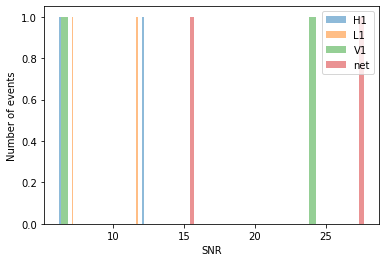

In [9]:

for key, values in data_generator_test.data['SNRs'].items():
    _ = plt.hist(values, label=key, alpha=0.5, bins=40)
_ = plt.hist((data_generator_test.data['SNRs']['H1']**2 + data_generator_test.data['SNRs']['L1']**2 + data_generator_test.data['SNRs']['V1']**2 )**0.5,
                label='net', alpha=0.5, bins=40)
plt.legend()
plt.xlabel('SNR')
plt.ylabel('Number of events')
plt.show()

In [10]:
(data_generator_test.data['SNRs']['H1']**2 + data_generator_test.data['SNRs']['L1']**2 + data_generator_test.data['SNRs']['V1']**2 )**0.5

array([15.39624868, 27.69616012])

# Load model

In [15]:



device='cuda:0'
model = GlasNSFTest(config).to(device)


In [16]:
ckpt_dir = config['ckpt_dir']
ckpt_path = f'{ckpt_dir}/checkpoint.pickle'

In [17]:

checkpoint = torch.load(ckpt_path)
start_epoch = checkpoint['epoch']
model.load_state_dict(checkpoint['model_state_dict']) 

print(f'Loaded states from {ckpt_path}, epoch={start_epoch}.')

Loaded states from trained_models/GlasNSFConv1DRes_1M_ampdirct/checkpoint.pickle, epoch=823.


In [21]:
dataset_test[0][1].shape

torch.Size([9, 256])

In [22]:
def mysample_GlasNSFWarpper(model, dataset, detector_names=None, ipca_gen=None, device='cpu', Nsample=5000, downsample_rate=1):
    model.eval()
    loss_list = []
    sample_list = []
    dataloader = DataLoader(dataset, batch_size=1, shuffle=False)
    with torch.no_grad():
        for theta, x in dataloader:
            theta = theta.to(device)
            x = x.to(device)
            #x = project_strain_data_FDAPhi(strain, psd, detector_names, ipca_gen).to(device)
            #loss = -model.log_prob(theta, x).mean()

            lenx = x.shape[-1]
            lentheta = theta.shape[-1]
            loss = -model.log_prob(theta, x=x).mean()
            samples = model.sample(Nsample, x=x)


            loss_list.append(loss.detach().cpu())
            sample_list.append(samples.cpu().numpy())
    samples = np.array(sample_list)
    samples = torch.from_numpy(samples)

    return samples.movedim(1,2), loss_list


In [27]:
sample_list, loss_list =  mysample_GlasNSFWarpper(model, dataset_valid, device=device, Nsample=5000)

In [28]:
loss_list

[tensor(6.7040),
 tensor(4.8475),
 tensor(13.8723),
 tensor(7.6109),
 tensor(8.3979),
 tensor(9.6363),
 tensor(11.9824),
 tensor(8.7434),
 tensor(9.3321),
 tensor(8.3751),
 tensor(4.9271),
 tensor(9.1399),
 tensor(20.0716),
 tensor(14.0720),
 tensor(9.1778),
 tensor(6.2483),
 tensor(8.1217),
 tensor(13.7560),
 tensor(12.8897),
 tensor(10.9178),
 tensor(7.8988),
 tensor(12.8886),
 tensor(3.9270),
 tensor(10.2884),
 tensor(11.7675),
 tensor(7.4881),
 tensor(10.7277),
 tensor(10.3013),
 tensor(8.2753),
 tensor(12.5228),
 tensor(10.7809),
 tensor(16.2707),
 tensor(13.9893),
 tensor(8.9470),
 tensor(13.5332),
 tensor(6.6020),
 tensor(10.3424),
 tensor(11.8767),
 tensor(10.0445),
 tensor(17.3338),
 tensor(7.4721),
 tensor(15.5783),
 tensor(17.2261),
 tensor(17.2878),
 tensor(7.9275),
 tensor(14.8476),
 tensor(12.3429),
 tensor(8.1593),
 tensor(10.4861),
 tensor(10.8759),
 tensor(9.4194),
 tensor(7.5607),
 tensor(10.2783),
 tensor(14.5766),
 tensor(8.4461),
 tensor(9.6218),
 tensor(12.9755),


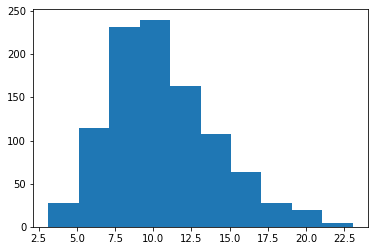

In [29]:
_ = plt.hist(loss_list)

In [31]:
def make_results(sample_list, parameter_names, injection_parameters_list=None):
    Nresult = len(sample_list)

    result_list = []
    for i in range(Nresult):
        result = bilby.gw.result.CompactBinaryCoalescenceResult()
        injection_parameters = {}
        posterior_dict = {}
        search_parameter_keys = []
        parameter_labels_with_unit = []
        for j,paraname in enumerate(parameter_names):
            if injection_parameters_list is None:
                injection_parameters[paraname] = 0
            posterior_dict[paraname] = np.array(sample_list[i][j].cpu())
            search_parameter_keys.append(paraname)
            parameter_labels_with_unit.append(paraname)
        
        result.posterior = pd.DataFrame.from_dict(posterior_dict)
        result.injection_parameters = injection_parameters
        result.search_parameter_keys = search_parameter_keys
        result.parameter_labels_with_unit = parameter_labels_with_unit
        result_list.append(result)
    
    return result_list

In [32]:
result_list = make_results(sample_list, PARAMETER_NAMES_CONTEXT_PRECESSINGBNS_BILBY)

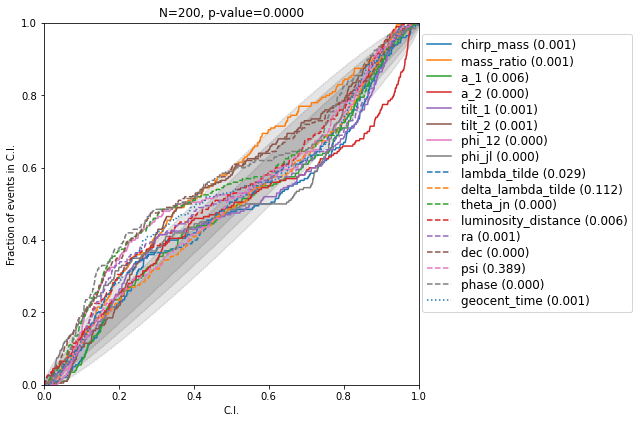

In [19]:
#fig = bilby.core.result.make_pp_plot(result_list, filename=None, save=False, confidence_interval=[0.68, 0.95, 0.997])
fig = make_pp_plot(result_list, filename = f"{config_path}/pp_plot.png", save=True, confidence_interval=[0.68, 0.95, 0.997])

In [33]:
look_index = 0
result = result_list[look_index]

In [24]:
config_datagenerator['context_parameter_names']

['chirp_mass',
 'mass_ratio',
 'a_1',
 'a_2',
 'tilt_1',
 'tilt_2',
 'phi_12',
 'phi_jl',
 'lambda_tilde',
 'delta_lambda_tilde',
 'theta_jn',
 'luminosity_distance',
 'ra',
 'dec',
 'psi',
 'phase',
 'geocent_time']

In [23]:
dataset_test[0][0]

tensor([ 0.2840,  0.7026,  0.0076,  0.0525,  0.8367,  0.8697,  1.1994,  0.4560,
         2.8903, -0.1305,  0.4184,  0.3245,  0.0216, -0.2330,  0.0229,  3.5834,
         0.0923])

In [34]:
result.posterior

,chirp_mass,mass_ratio,a_1,a_2,tilt_1,tilt_2,phi_12,phi_jl,lambda_tilde,delta_lambda_tilde,theta_jn,luminosity_distance,ra,dec,psi,phase,geocent_time
0,1.576140,0.432061,0.049182,0.056374,1.032472,0.139902,3.098070,0.294797,3973.577637,-862.339172,0.883667,67.501366,0.593031,-1.048148,3.064834,2.513618,0.023146
1,1.523282,0.428305,0.075427,0.040405,1.303114,2.240120,6.169028,3.589469,4530.792969,-1227.795654,2.455991,132.237564,0.032417,0.513761,2.645854,2.728405,0.000662
2,1.648707,0.487587,0.052597,0.092411,1.280962,0.828834,4.808096,3.812220,4841.410156,-1370.149536,2.383239,96.910614,1.346057,1.218869,0.112032,0.594702,0.038483
3,1.548265,0.461520,0.071573,0.078341,1.858019,1.438958,4.292487,3.532274,5432.492188,-1490.380371,2.512140,149.149323,2.844500,-0.784720,1.675902,4.684857,0.055160
4,1.616936,0.506378,0.072299,0.030299,1.665008,1.420283,0.222909,3.729501,6092.973633,-1396.389160,2.424106,143.078201,3.010363,-0.578487,3.021038,3.561926,0.071586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,1.599260,0.503778,0.008483,0.095256,2.174828,2.215077,4.913647,3.383518,6346.007812,-1561.019775,2.227594,71.172127,2.444644,0.095036,2.920207,2.911244,0.067740
4996,1.386889,0.342051,0.046361,0.052118,0.741241,1.932275,2.330945,4.277771,3159.552979,-765.698975,2.086620,65.257324,1.268790,1.148046,2.390919,0.808156,-0.017430
4997,1.555260,0.436012,0.035652,0.028673,0.884005,1.532292,4.714256,3.974893,4353.315430,-984.704773,2.126390,71.654419,0.626115,0.691578,1.468696,1.248121,-0.046540
4998,1.666847,0.528488,0.050139,0.054205,1.675699,1.124557,2.466640,2.789591,6111.155762,-1475.131104,1.784739,89.251602,2.537757,-1.337685,1.929039,0.340110,0.090788


In [37]:
dataset_valid[0][0]

tensor([ 1.5853e+00,  4.5131e-01,  9.5778e-02,  7.7073e-02,  1.2754e+00,
         1.0872e+00,  2.4460e+00,  3.7092e+00,  4.4877e+03, -9.6017e+02,
         2.6394e+00,  1.4128e+02,  4.3511e-01,  1.2323e+00,  2.7982e+00,
         5.6703e-01, -9.3359e-03])

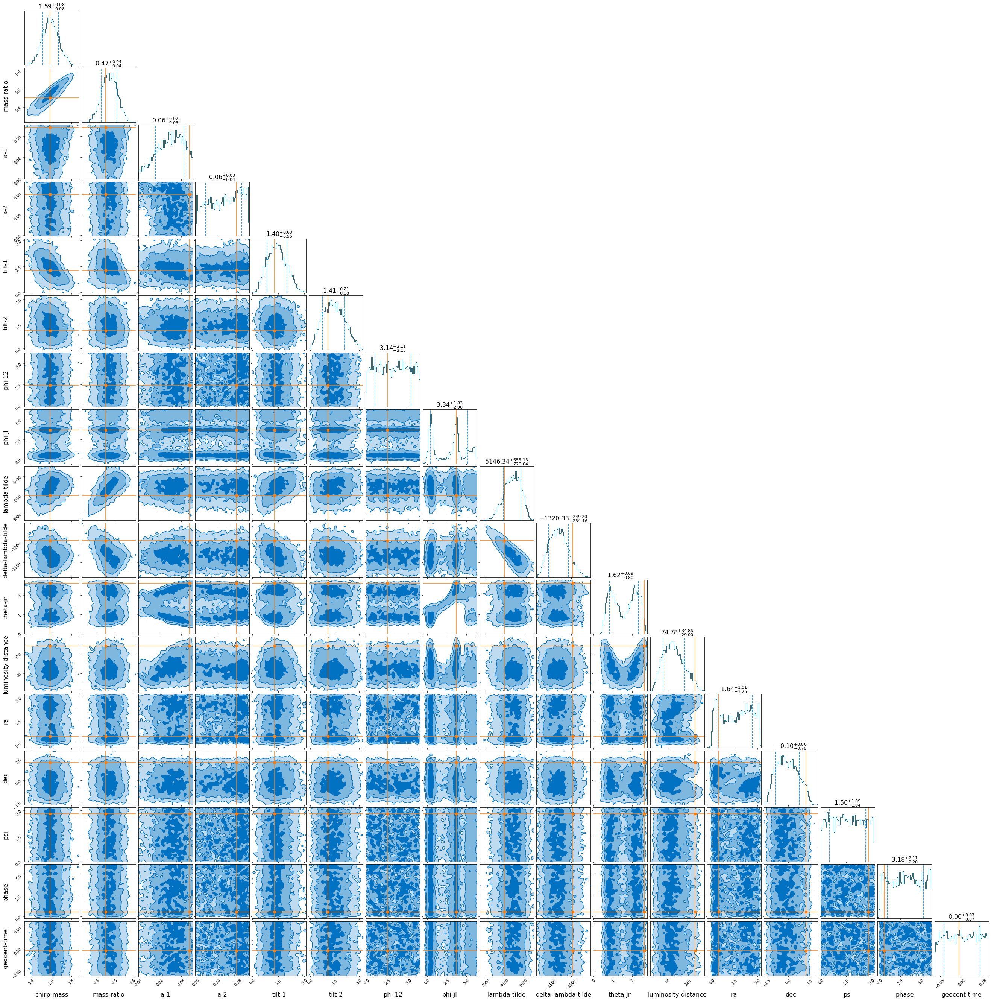

In [38]:
injdict = {}
for i,paraname in enumerate(config_datagenerator['context_parameter_names']):
    injdict[paraname] = dataset_valid[0][0][i]

result.injection_parameters = injdict
fig = result.plot_corner(parameters=result.injection_parameters, save=False, filename = f"{config_path}/corner{look_index}.png")

In [41]:
result_prior = bilby.core.result.read_in_result('prior_samples.pkl')
results = [result, result_prior]


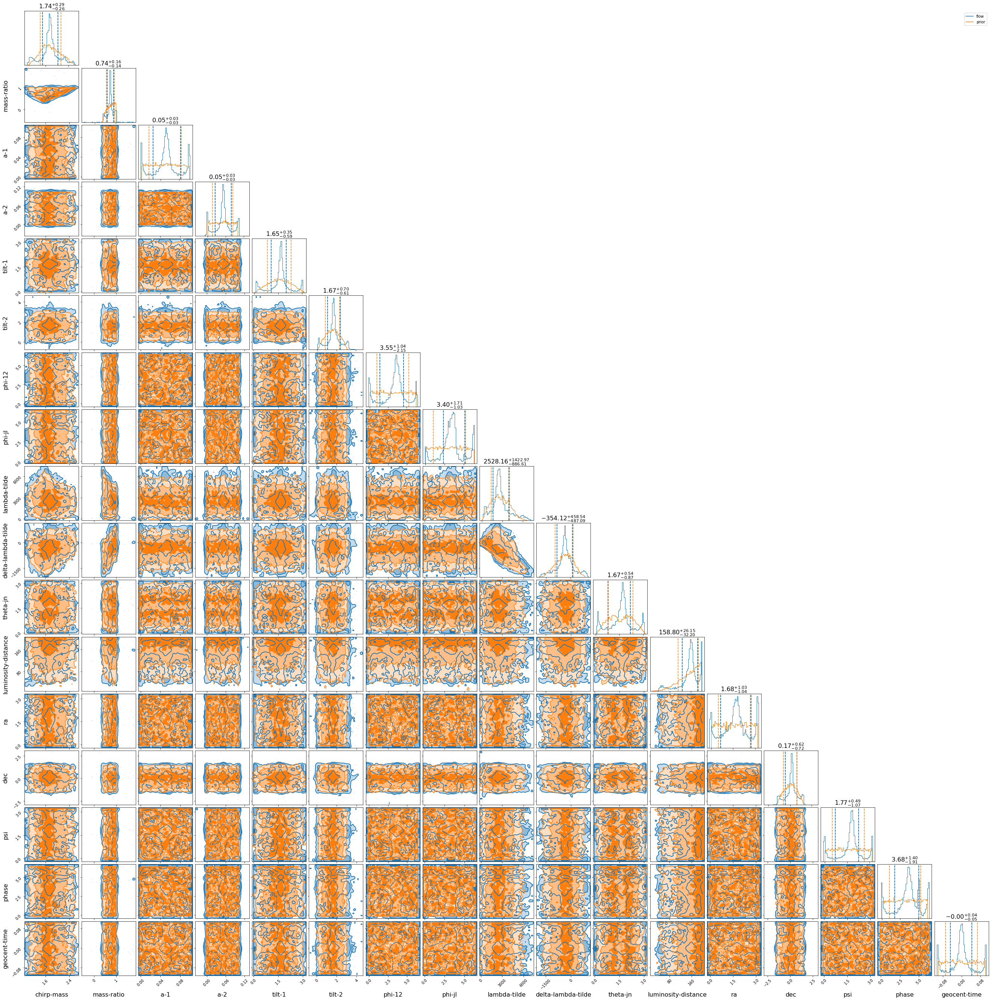

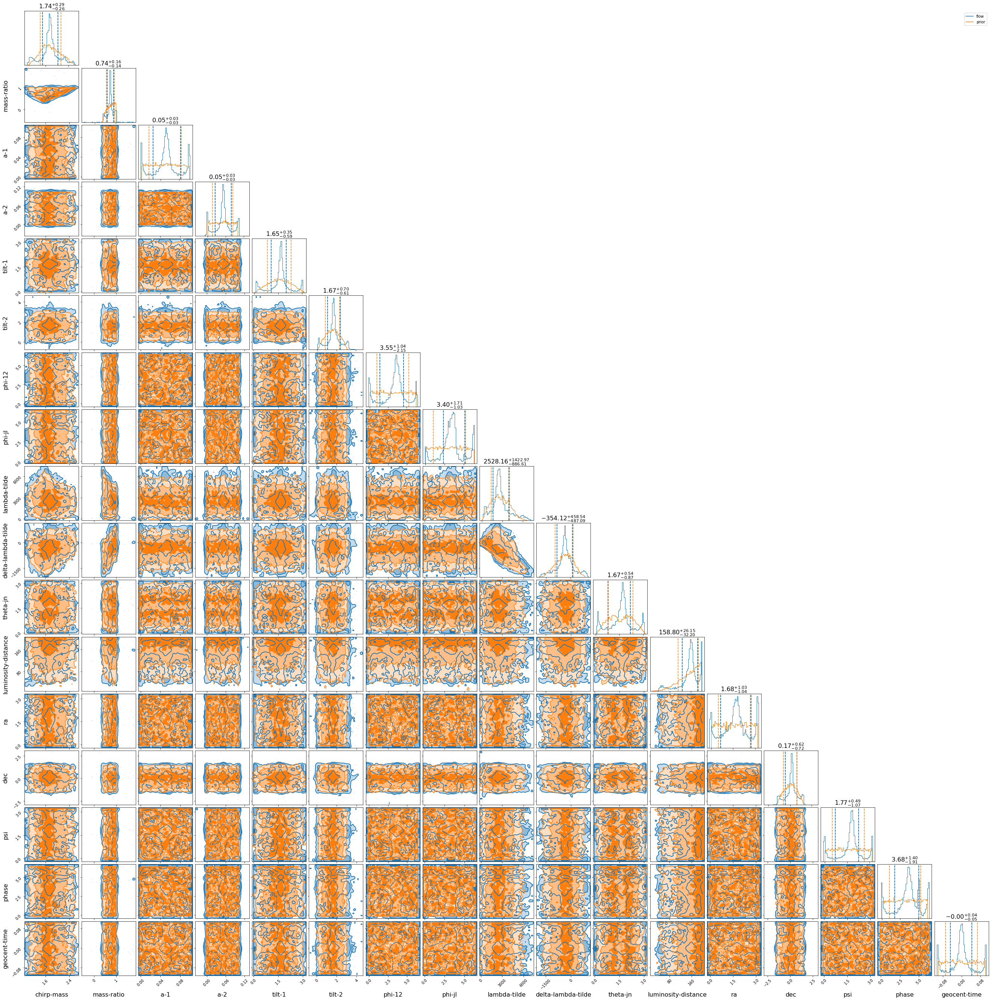

In [42]:
fig = bilby.core.result.plot_multiple(results, filename=None, labels=['flow', 'prior'], colours=None, save=False, evidences=False, corner_labels=None, linestyles=None)